# Differential evolution

Algorithm: https://en.wikipedia.org/wiki/Differential_evolution

Unified Differential Evolution: https://docs.scipy.org/doc/scipy/reference/generated/scipy.optimize.differential_evolution.html

In [4]:
from tqdm import tqdm
from IPython.display import clear_output
from scipy.optimize import differential_evolution, OptimizeResult
from modules.plotter import print_result, plot_fitness_improvement
from modules.golomb_problem import init_simple_problem, init_medium_problem, orbital_golomb_array

# from matplotlib_inline.backend_inline import set_matplotlib_formats
# set_matplotlib_formats('jpeg')  # Configures Matplotlib to output inline plots as JPEGs, reducing the file size.

N_ITERATION = 8
VARIANTS = [i for i in range(1, 19)] # all

def get_n_iteration(n_sats: int, force_golomb : bool = False):
    alpha = 1.5 if force_golomb else 1
    return int(alpha * n_sats * 10)

def get_population_size(n_sats: int, force_golomb : bool = False):
    return 50

def optimize_and_plot(problem : orbital_golomb_array , fitness, is_forced: bool = False):
    def callback(intermediate_result : OptimizeResult):
        iteration_fitness_log.append(intermediate_result.fun)
        
    solutions_log, fitness_log = [], []
    for _ in tqdm(range(N_ITERATION)):
        iteration_fitness_log = []
        result = differential_evolution(
            func=fitness,
            bounds=[(-1.0, 1.0) for _ in range(problem.n_sat * 6)],
            x0=None,
            strategy="best1bin",
            maxiter=get_n_iteration(problem.n_sat, is_forced),
            popsize=get_population_size(problem.n_sat, is_forced),
            mutation=(0.05, 1),
            recombination=0.7,
            workers=-1,
            updating='deferred',
            tol=0.001,
            disp=True,
            polish=True,
            callback=callback,
        )
        clear_output()

        solutions_log.append(result.x)
        fitness_log.append(iteration_fitness_log)
    average_fitness = [sum(fitness) / N_ITERATION for fitness in zip(*fitness_log)]

    plot_fitness_improvement(average_fitness)
    print_result(problem, solutions_log, show_simulated_reconstruction=True)
    return solutions_log

## Simple Problem

### Stock Problem

100%|██████████| 8/8 [08:30<00:00, 63.80s/it]


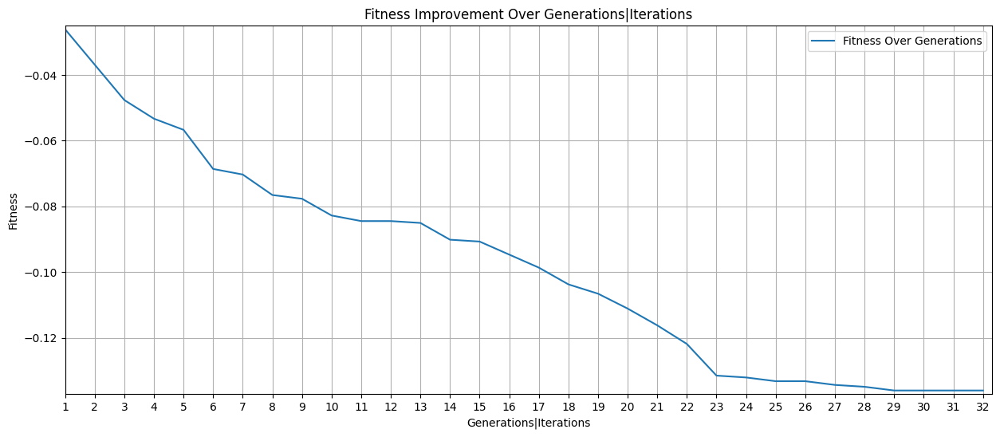

N sat:  5 	Grid size:  11
LOG:
fitness:	[-0.142857, -0.088435, -0.142857, -0.142857, -0.142857, -0.142857, -0.142857, -0.142857]
distances:	[0.8889, 0.6111, 0.8444, 0.8889, 0.8889, 0.9556, 0.8, 0.8222]
sats:	[1.0, 0.8444, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]
--- --- ---
**Score is mean of 8 iterations**
Default Fitness: -0.1360544	Unique Distances [%]: 83.7500	Satellites in Grid [%]: 98.0556
--- --- ---
Best solution: [-0.35627902 -0.00157062  0.26960555 -0.10645997  0.15967175  0.52006532
 -0.02781093 -0.24197618 -0.26838987 -0.07603188  0.17028377  0.89695779
  0.13944462 -0.43996632 -0.35169727  0.48740396 -0.19860027  0.10600666
 -0.35897527  0.38381253 -0.97156299 -0.05155287  0.70488929 -0.24833023
  0.38827009 -0.72280901  0.41968992  0.19233529  0.25659582 -0.60132556]
Default Fitness: -0.1428571	Unique Distances [%]: 95.5556	Satellites in Grid [%]: 100.0000


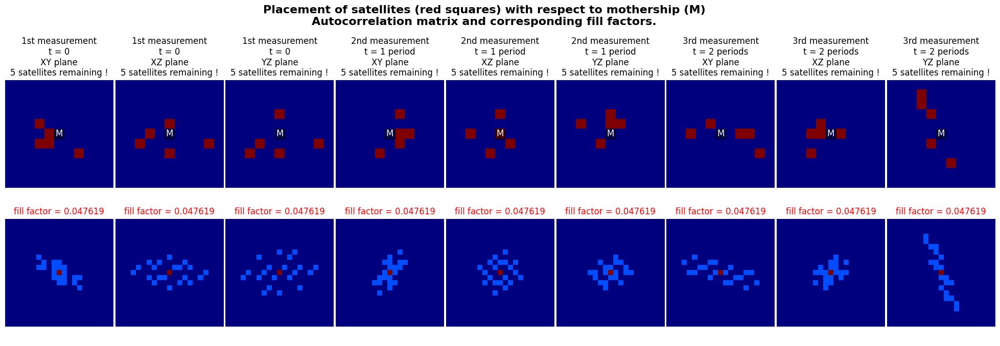

---

XY	SSIM = 13.4229%


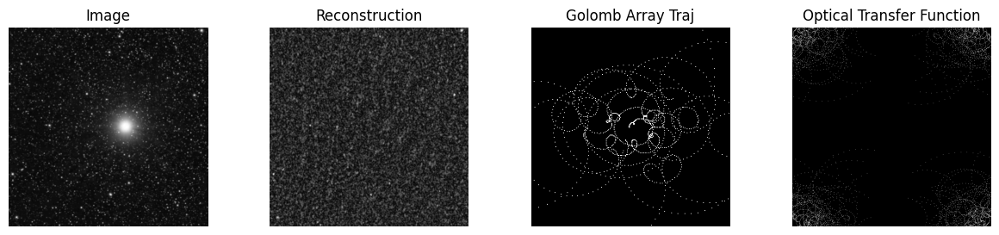

XZ	SSIM = 17.9681%


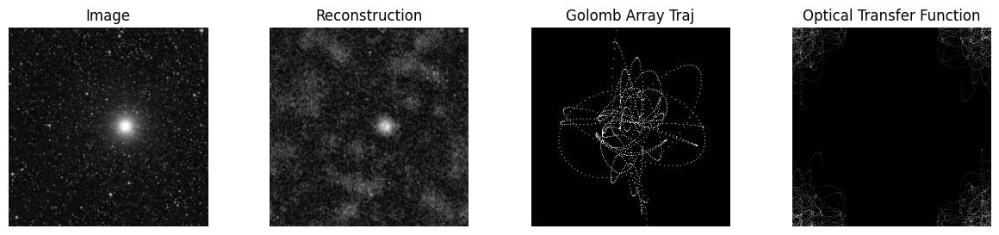

YZ	SSIM = 14.3159%


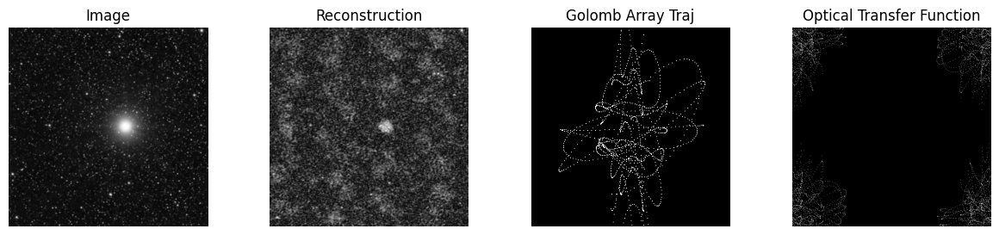

---

XY	SSIM = 12.1720%


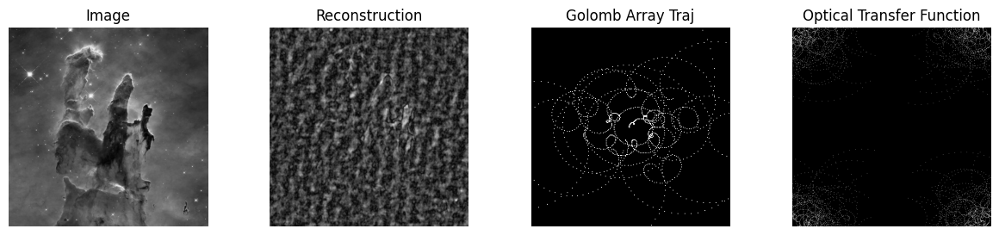

XZ	SSIM = 17.1114%


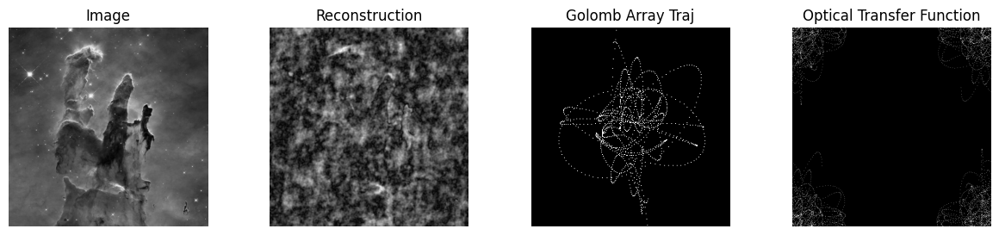

YZ	SSIM = 14.9116%


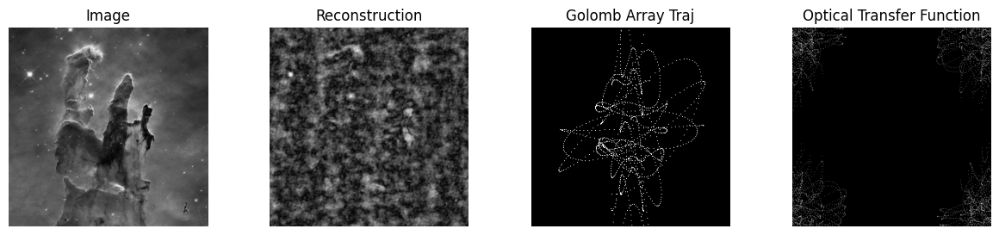

In [5]:
N_ITERATION = 8
udp = init_simple_problem()
def fitness(x) :
    return udp.fitness_impl(x=x,reduce_fill_if_not_optimal=False)[0]

res_simple_stock = optimize_and_plot(
    udp,
    fitness,
    False
)
del udp,fitness

### Force Golomb

100%|██████████| 8/8 [14:23<00:00, 107.88s/it]


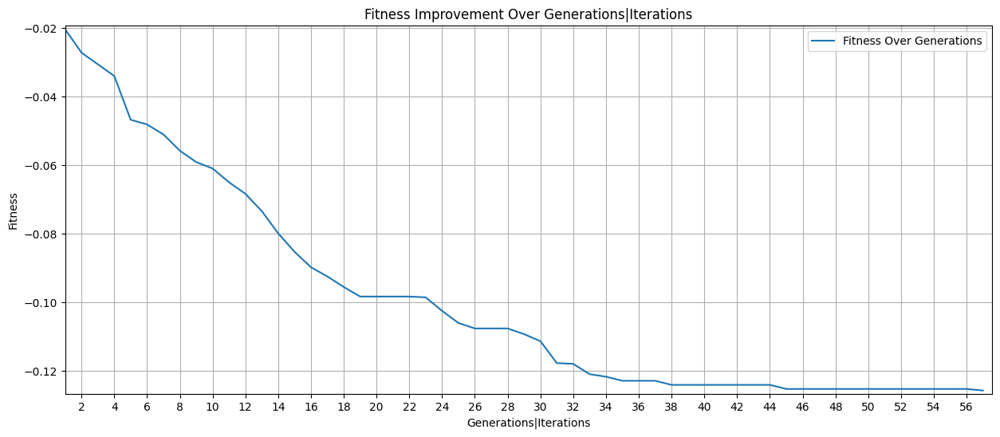

N sat:  5 	Grid size:  11
LOG:
fitness:	[-0.142857, -0.142857, -0.142857, -0.142857, -0.142857, -0.088435, -0.142857, -0.088435]
distances:	[0.9778, 0.9333, 1.0, 1.0, 1.0, 0.6667, 0.9556, 0.7111]
sats:	[1.0, 1.0, 1.0, 1.0, 1.0, 0.8667, 1.0, 0.8667]
--- --- ---
**Score is mean of 8 iterations**
Default Fitness: -0.1292517	Unique Distances [%]: 90.5556	Satellites in Grid [%]: 96.6667
--- --- ---
Best solution: [-0.18500703  0.0247491   0.01617458  0.26681353  0.27064332  0.2593572
 -0.11544906 -0.54979518 -0.1555743  -0.34193964 -0.78225646  0.1901457
  0.72561908 -0.56836349  0.10975607 -0.36074658 -0.76695242 -0.10640309
  0.3496229  -0.29573437 -0.51918502  0.03561718  0.09308914  0.65819684
  0.7149116  -0.35103781  0.70431192 -0.68289107  0.31327949  0.37462629]
Default Fitness: -0.1428571	Unique Distances [%]: 100.0000	Satellites in Grid [%]: 100.0000


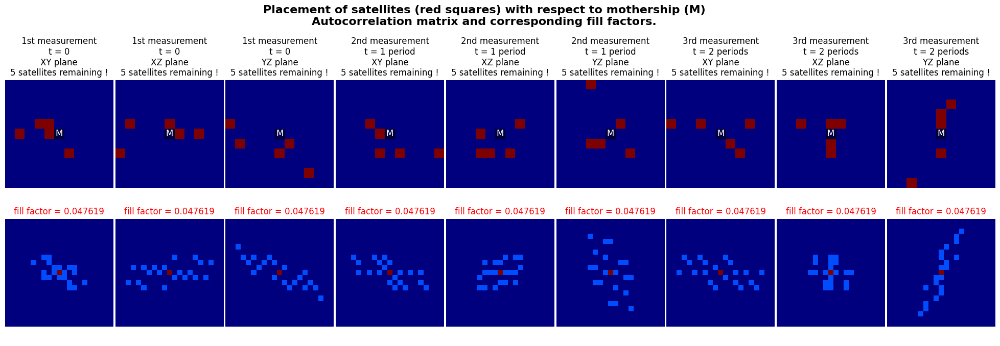

---

XY	SSIM = 12.8928%


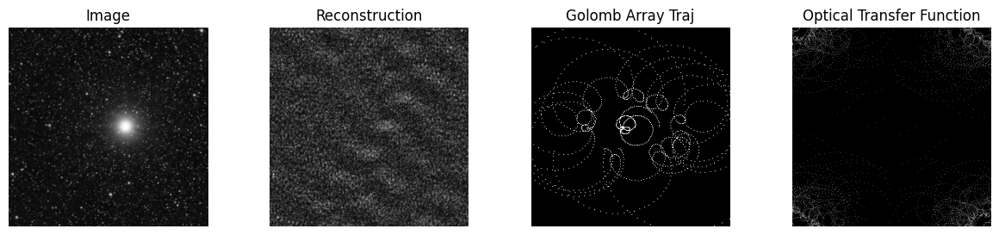

XZ	SSIM = 18.6972%


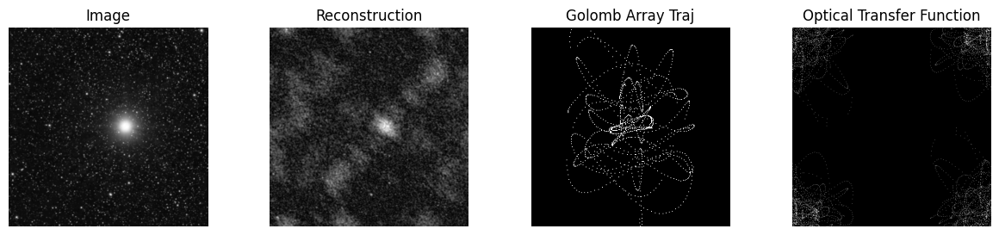

YZ	SSIM = 13.5899%


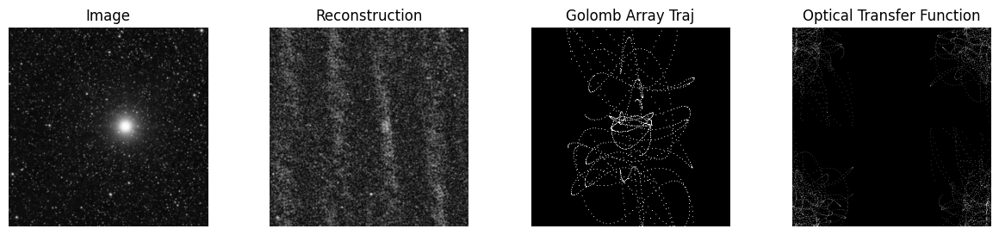

---

XY	SSIM = 12.0153%


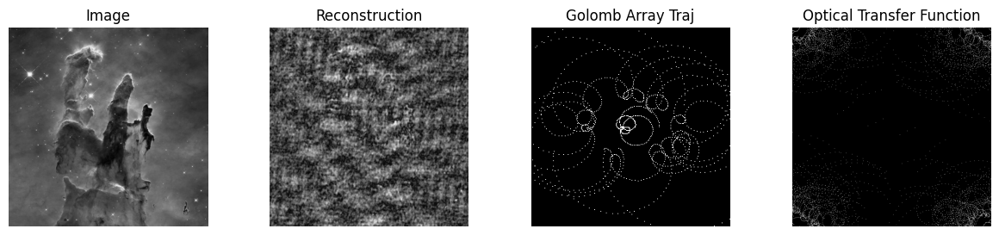

XZ	SSIM = 18.6188%


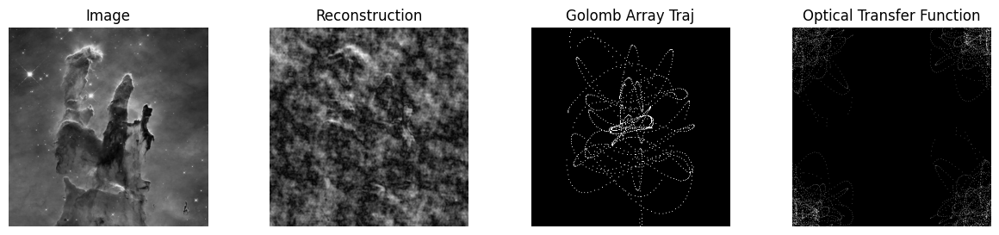

YZ	SSIM = 13.8356%


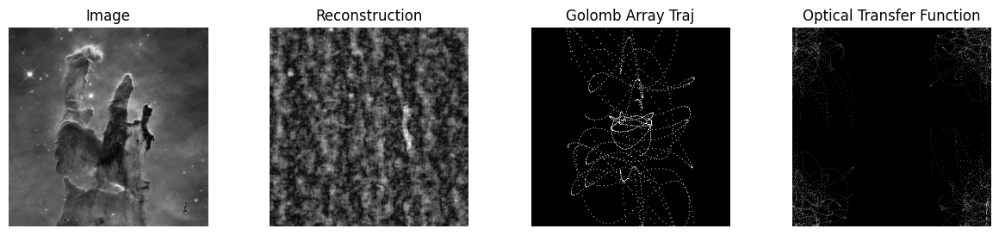

In [7]:
N_ITERATION = 8
udp = init_simple_problem()
def fitness(x):
    return udp.fitness_impl(x,reduce_fill_if_not_optimal=True)[0]

res_simple_stock = optimize_and_plot(
    udp,
    fitness,
    True
)
del udp

## Medium Problem

### Stock Problem

100%|██████████| 4/4 [3:04:57<00:00, 2774.45s/it]


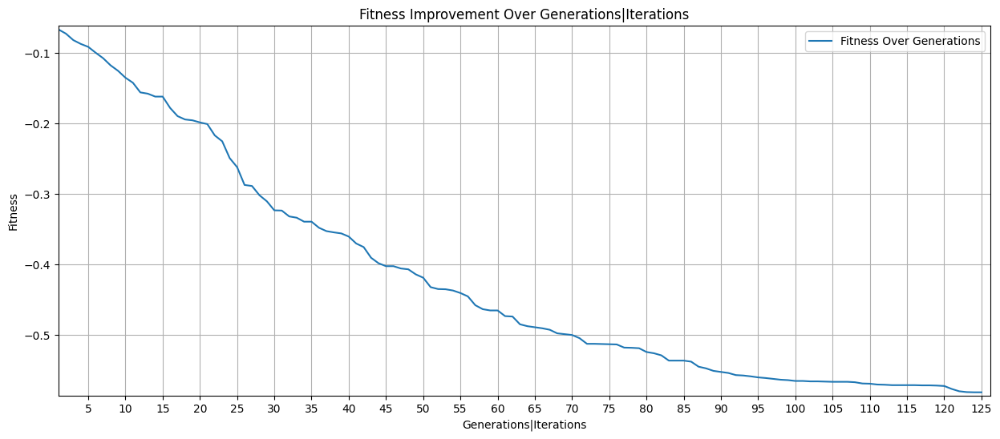

N sat:  40 	Grid size:  21
LOG:
fitness:	[-0.649018, -0.527662, -0.601428, -0.549078]
distances:	[0.0595, 0.0651, 0.0588, 0.0605]
sats:	[0.7528, 0.6639, 0.7444, 0.6806]
--- --- ---
**Score is mean of 4 iterations**
Default Fitness: -0.5817965	Unique Distances [%]: 6.1004	Satellites in Grid [%]: 71.0417
--- --- ---
Best solution: [ 0.44810314 -0.09886209 -0.13773348  0.21816581 -0.17597769 -0.13607243
  0.08577037  0.0188079   0.07793572  0.13819756 -0.14057977 -0.0031508
 -0.61732788  0.30681623  0.0928334   0.18552626 -0.22054894  0.09695262
 -0.20242713 -0.25131509  0.16466431 -0.10646907  0.15565768  0.54678971
  0.07419771  0.03122131 -0.0977279  -0.45239279  0.09188987  0.1197522
 -0.06197001 -0.1892902   0.60103621 -0.10689355 -0.15944617 -0.02400275
  0.10717286  0.20823714  0.30305357 -0.23772334  0.4755706   0.34938695
  0.14943019 -0.88441091 -0.11925376 -0.65876294  0.05643087  0.56804139
 -0.13379701  0.16721478  0.56063837 -0.15101701  0.28239756 -0.03576902
  0.46599946  

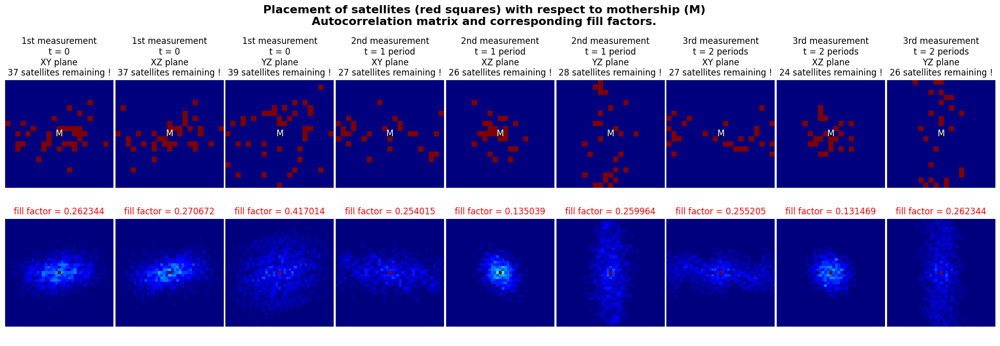

---

XY	SSIM = 94.3365%


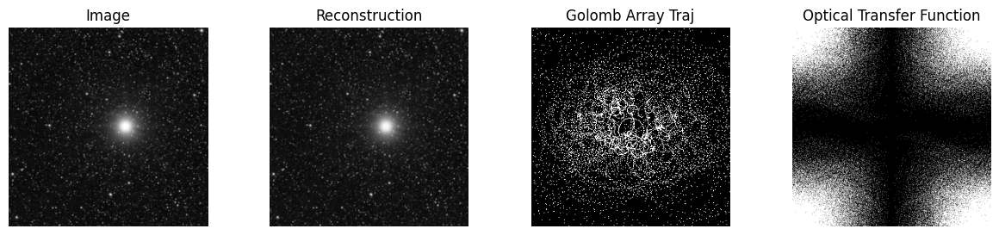

XZ	SSIM = 93.2397%


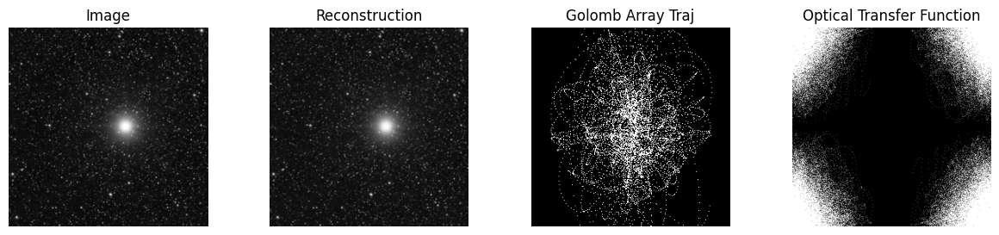

YZ	SSIM = 93.2805%


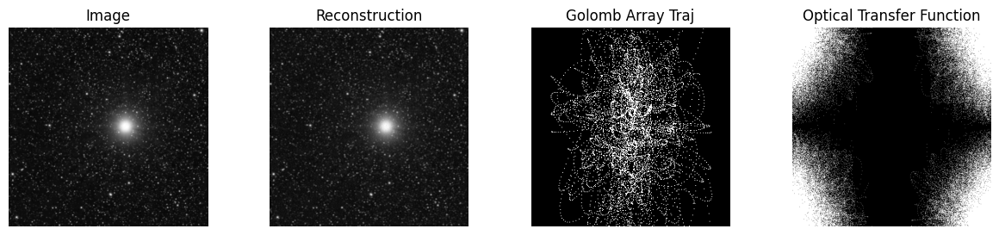

---

XY	SSIM = 94.9454%


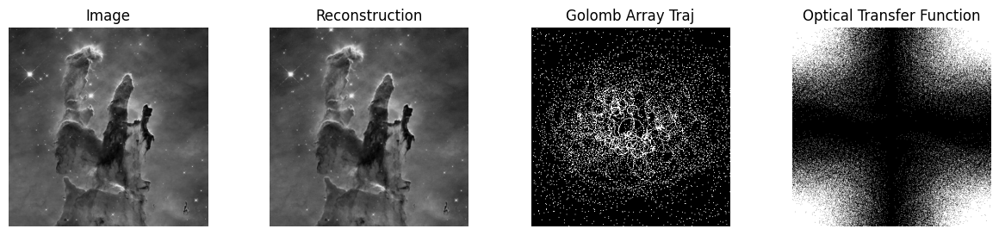

XZ	SSIM = 94.3616%


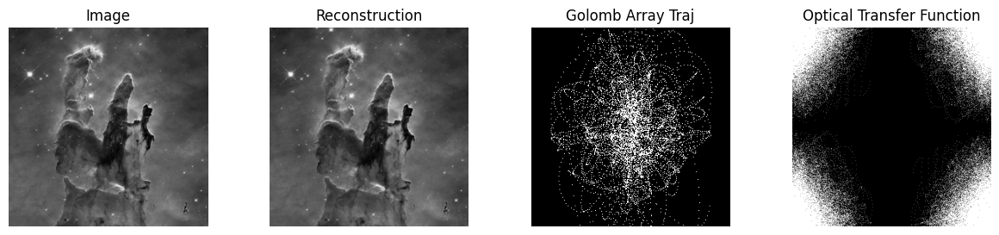

YZ	SSIM = 94.4655%


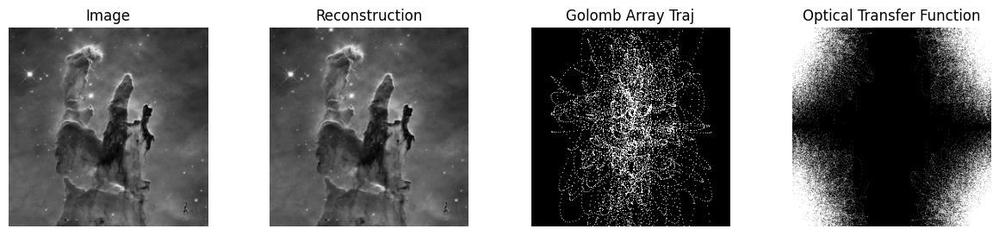

In [3]:
N_ITERATION = 4
udp = init_medium_problem()
def fitness(x) :
    return udp.fitness_impl(x=x,reduce_fill_if_not_optimal=False)[0]

res_simple_stock = optimize_and_plot(
    udp,
    fitness,
    False
)
del udp,fitness

100%|██████████| 4/4 [1:30:07<00:00, 1351.89s/it]


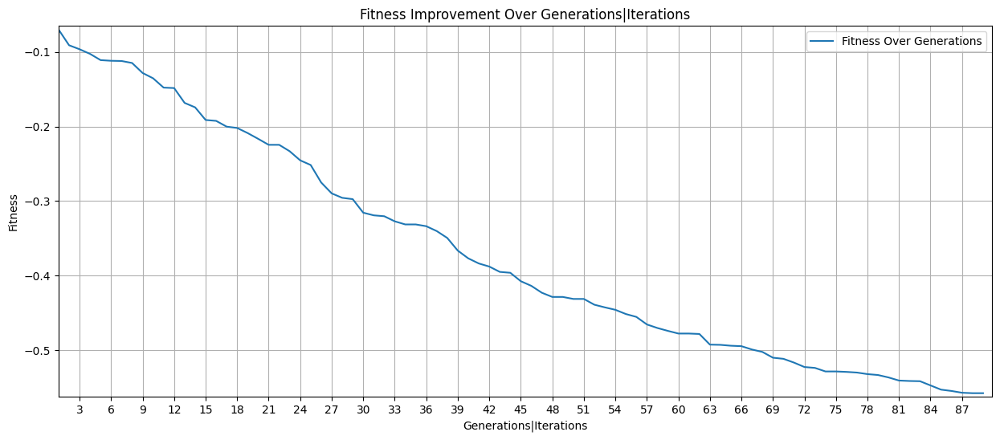

N sat:  40 	Grid size:  21
LOG:
fitness:	[-0.627603, -0.58834, -0.601428, -0.533611]
distances:	[0.0647, 0.0661, 0.0543, 0.0632]
sats:	[0.7194, 0.7028, 0.7139, 0.675]
--- --- ---
**Score is mean of 4 iterations**
Default Fitness: -0.5877454	Unique Distances [%]: 6.2073	Satellites in Grid [%]: 70.2778
--- --- ---
Best solution: [ 0.24260009 -0.48769856 -0.18783054 -0.21420311  0.09402392  0.05564847
  0.21576902 -0.29205264 -0.02016049 -0.05857424 -0.29620243  0.52559337
  0.27648943 -0.75964067  0.38985158 -0.19786544 -0.17189979  0.30675194
 -0.35480802 -0.06942062  0.30933414 -0.32722885 -0.21510982 -0.1243568
  0.1872663   0.04563183  0.32058177  0.15883732  0.49278314  0.12380269
  0.16847193  0.04846142  0.27887997 -0.67681833  0.58603412 -0.22258187
 -0.35208799 -0.35427954  0.05932667 -0.28169568  0.76932586 -0.74425441
 -0.25659695  0.17047331 -0.36972298  0.80049461 -0.71227344 -0.14036519
 -0.00614539  0.1470629   0.40017522  0.50959582  0.7655003  -0.37338523
 -0.81311012 -0

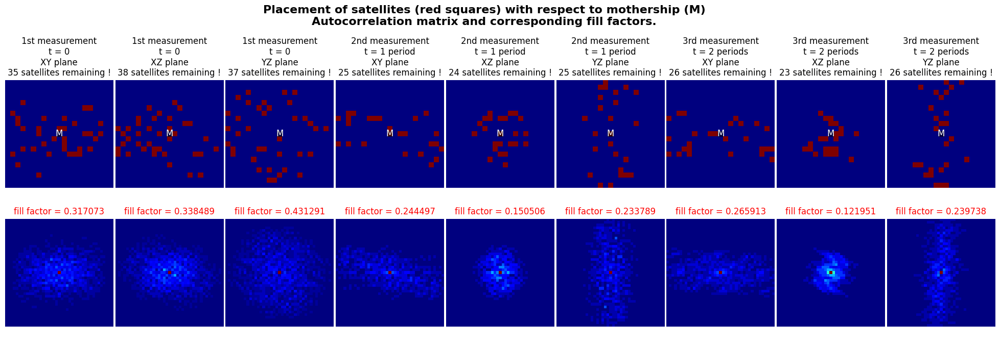

---

XY	SSIM = 92.9752%


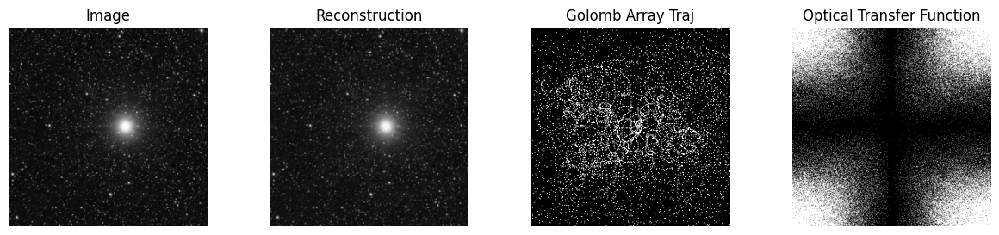

XZ	SSIM = 91.4591%


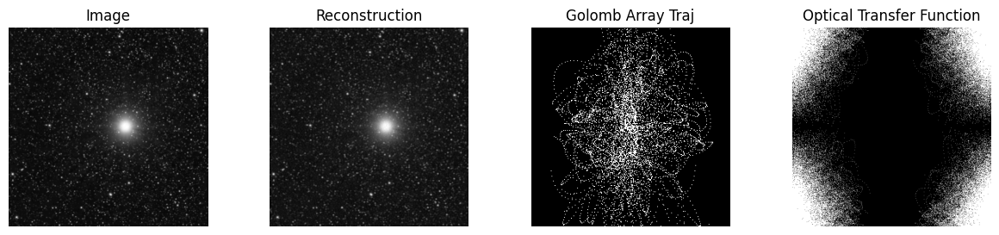

YZ	SSIM = 91.4494%


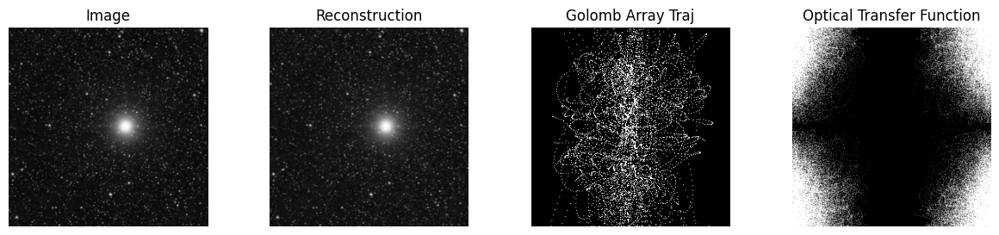

---

XY	SSIM = 93.9058%


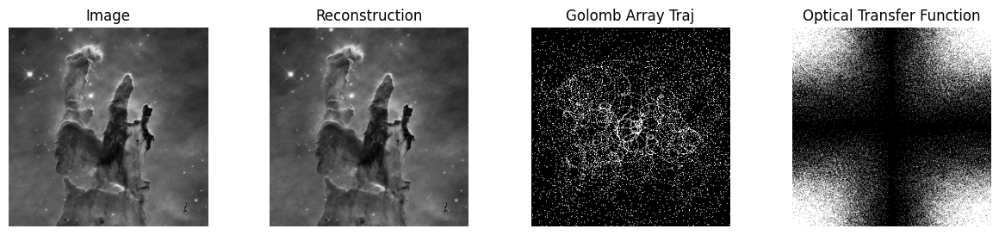

XZ	SSIM = 93.4436%


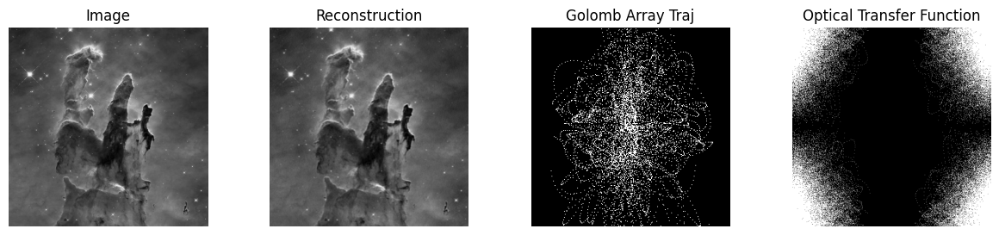

YZ	SSIM = 93.3110%


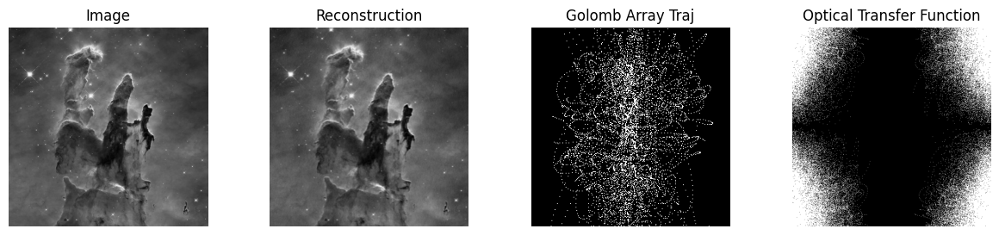

In [4]:
N_ITERATION = 4
udp = init_medium_problem()
def fitness(x) :
    return udp.fitness_impl(x=x,reduce_fill_if_not_optimal=False)[0]

res_simple_stock = optimize_and_plot(
    udp,
    fitness,
    False
)
del udp,fitness

### Force Golomb

100%|██████████| 3/3 [3:37:18<00:00, 4346.02s/it]  


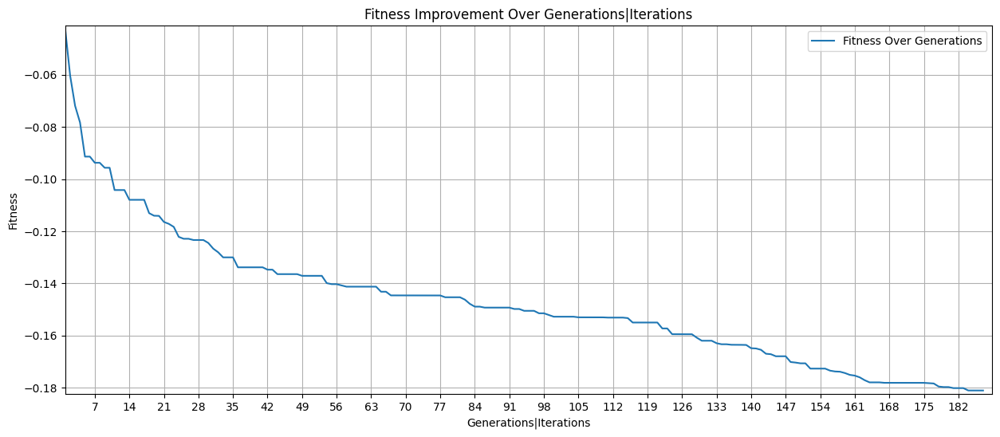

N sat:  40 	Grid size:  21
LOG:
fitness:	[-0.250446, -0.293278, -0.226651]
distances:	[0.098, 0.0996, 0.0919]
sats:	[0.55, 0.5472, 0.5278]
--- --- ---
**Score is mean of 3 iterations**
Default Fitness: -0.2567916	Unique Distances [%]: 9.6486	Satellites in Grid [%]: 54.1667
--- --- ---
Best solution: [-0.29451089 -0.29781154 -0.79026157  0.17167602 -0.14004163 -0.34286172
 -0.88878716 -0.09943513  0.57529971  0.48352937  0.05813764  0.08779818
  0.6857986  -0.05422406  0.81720013  0.50174167 -0.24140149  0.96366673
 -0.19915413 -0.33848197 -0.06952209  0.047335    0.28628207 -0.11373023
 -0.51925039 -0.36917446  0.28609164 -0.95860747 -0.00558735  0.98808683
  0.16888628 -0.6097919   0.32338431 -0.11279433  0.16041953 -0.79173511
 -0.28390913  0.3892692   0.1052815  -0.19017611  0.3363762  -0.93193192
  0.62408074  0.44489216 -0.16698522 -0.37656948  0.25785291 -0.12410317
  0.64707186 -0.49492901 -0.60017444 -0.47794999 -0.44054015  0.67751349
  0.61083409 -0.81097479  0.93747284 -0.23

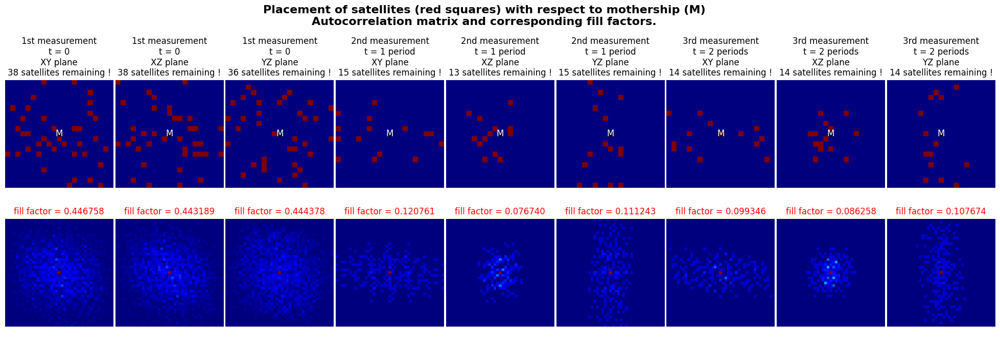

---

XY	SSIM = 82.7499%


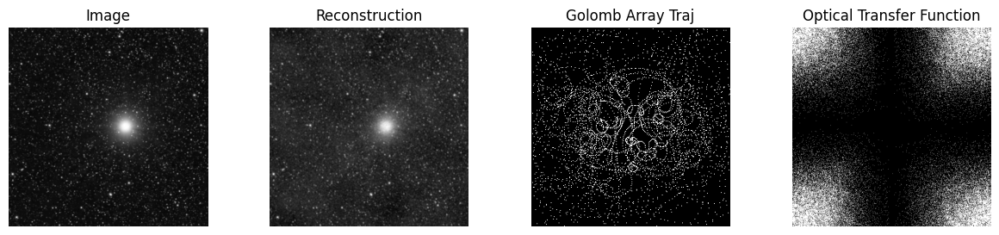

XZ	SSIM = 84.3573%


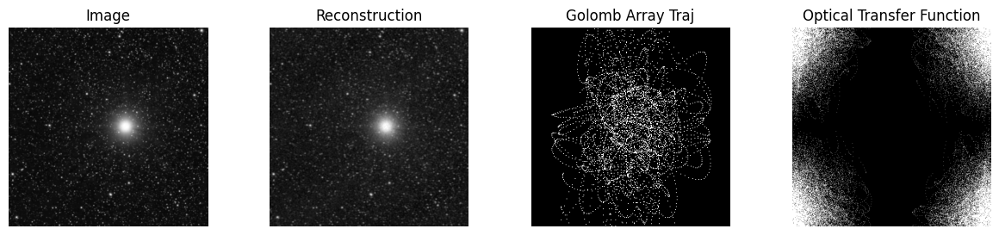

YZ	SSIM = 83.5168%


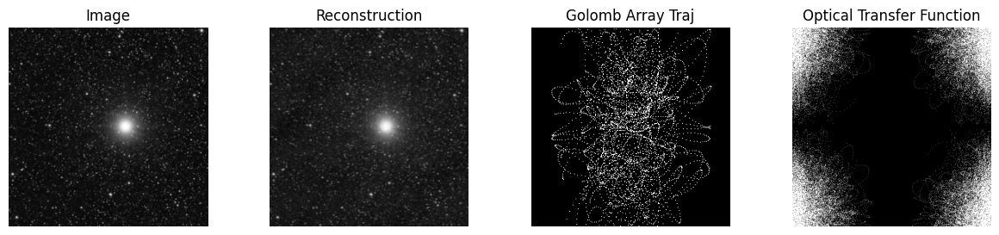

---

XY	SSIM = 85.2629%


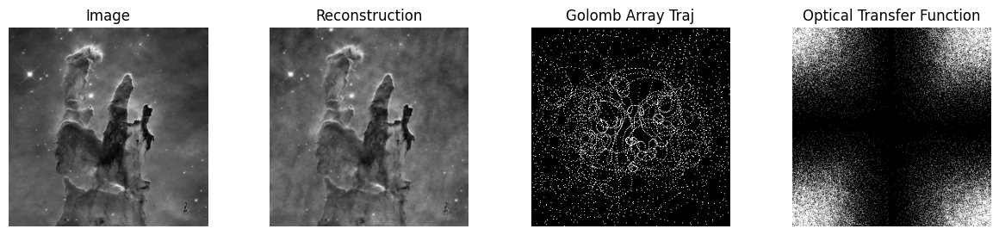

XZ	SSIM = 88.9855%


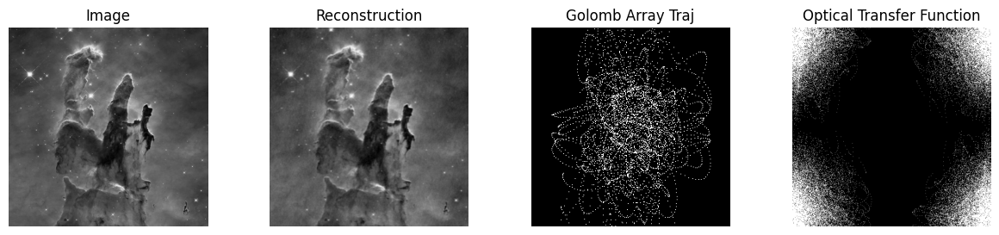

YZ	SSIM = 88.4110%


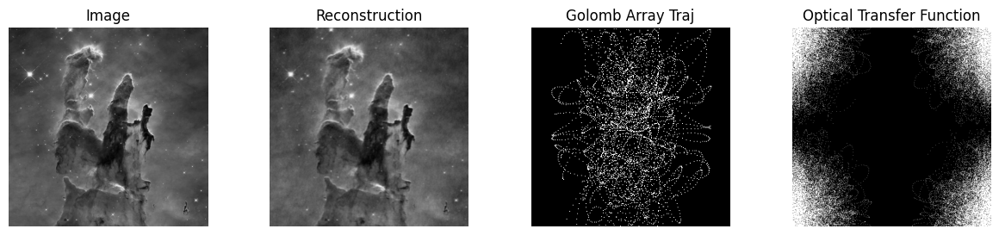

In [5]:
N_ITERATION = 3
udp = init_medium_problem()
def fitness(x) :
    return udp.fitness_impl(x=x,reduce_fill_if_not_optimal=True)[0]

res_simple_stock = optimize_and_plot(
    udp,
    fitness,
    True
)
del udp,fitness